In [1]:
using Pkg
using IJulia
using DifferentialEquations
using Plots, CSV, XLSX, DataFrames
using Peaks, Statistics,Roots, NaNStatistics, Random
using StaticArrays
using IterTools
using Printf
using XLSX
using DataFrames

function freeR(rt,at,ks)
    return (rt .- at .- ks .+ sqrt.((at .- rt .- ks).^2 .+ 4*at*ks))/2
end
function freeA(rt,at,ks)
    return (at .- rt .- ks .+ sqrt.((at .- rt .- ks).^2 .+ 4*at*ks))/2
end
function compRA(rt,at,ks)
    return (at .+ rt .+ ks .- sqrt.((at .- rt .- ks).^2 .+ 4*at*ks))/2
end
function coeffI(rt,at,ka,ks,kb,kd)
    return (ks .+ (ks*kd/kb) .+ freeR(rt,at,ks)) ./ (ks .+ (ks*kd/kb) .+ freeR(rt,at,ks)*(ks*kd/(ka*kb)))
end
function coeffJ(rt,at,ka,ks,kb,kd)
    return (ks .+ ka .+ freeR(rt,at,ks)) ./ (ks .+ (ks*kd/kb) .+ freeR(rt,at,ks)*(ks*kd/(ka*kb)))
end
function tranBSD(rt,at,ka,ks,kb,kd)
    return (coeffI(rt,at,ka,ks,kb,kd) .* freeA(rt,at,ks) ./ ka) ./ (1 .+ (coeffI(rt,at,ka,ks,kb,kd) .* freeA(rt,at,ks) ./ ka) .+ (coeffJ(rt,at,ka,ks,kb,kd) .* freeA(rt,at,ks) ./ ka) .* (freeR(rt,at,ks) ./ kb))
end

function rhythm(t,amp,p,ph,lev)
    rate = (amp/2)*cos(2*pi*(t-ph)/p)+lev
    return rate
end
function modelDro!(dp,p,pa,t)
    (a3,b1,b2,b3,AT,Ka,Ks,Kb,Kd) = pa
    dp[1] = tranBSD(p[3],AT,Ka,Ks,Kb,Kd)-b1*p[1]
    dp[2] = p[1]-b2*p[2]-a3*p[2]
    dp[3] = a3*p[2]-b3*p[3]
end
function modelWT!(dp,p,pa,t)
    (a3,b1,b2,b3,AT,Ka,Ks,Kb,Kd,ampD,phD,ampT,phT,levD,levT) = pa                             # AT 변경해야 함. 
    dp[1] = tranBSD(p[3],AT,Ka,Ks,Kb,Kd)-rhythm(t,ampD,24,phD,levD)*p[1]                       # Decay
    dp[2] = rhythm(t,ampT,24,phT,levT)*p[1]-b2*p[2]-a3*p[2]                                   # Translation
    dp[3] = a3*p[2]-b3*p[3]
end
function cv(x)
    return std(x) / mean(x)
end

# wt scale로 wt그래프 그리는 함수
function create_combined_plot_wt(detWT, timept, wtMper, wtPER, bound, wtMperScale, wtPerScale)      
    # Create the first subplot
    println("ylim: ", 2)
    p1 = plot([0:0.01:bound], detWT[1, 90001:(90001+bound*100)]/wtMperScale, 
        c=:green, label="Sim", linewidth=3)
    plot!(p1, timept, wtMper, seriestype=:scatter, c=:red, label="Exp (dots)", legend=:bottomleft)
    xlims!(p1, 0, bound)
    ylims!(p1, 0, 2)
    title!(p1, "WT_mPer")

    # Create the second subplot
    p2 = plot([0:0.01:bound], detWT[3, 90001:(90001+bound*100)]/wtPerScale, 
        c=:green, label="Sim", linewidth=3)
    plot!(p2, timept, wtPER, seriestype=:scatter, c=:red, label="Exp (dots)", legend=:bottomleft)
    xlims!(p2, 0, bound)
    ylims!(p2, 0, 2)
    title!(p2, "WT_PER")

    # Combine the plots
    return plot(p1, p2, layout = (2, 1), size = (1200, 1200))
end

# pcm scale로 pcm 그래프 그리는 함수
function create_combined_plot_pcm(detDro, timept, pcmMper, pcmPER, bound, pcmMperScale, pcmPerScale)
    # Create the first subplot
    println("ylim: ", 2)
    p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
        c=:green, label="Sim", linewidth=3)
    plot!(p1, timept, pcmMper, seriestype=:scatter, c=:red, label="Exp (dots)", legend=:bottomleft)
    xlims!(p1, 0, bound)
    ylims!(p1, 0, 1.2)
    title!(p1, "pcm_mPer")
    println("ylim: ", 30)

    # Create the second subplot
    p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPerScale, 
        c=:green, label="Sim", linewidth=3)
    plot!(p2, timept, pcmPER, seriestype=:scatter, c=:red, label="Exp (dots)", legend=:bottomleft)
    xlims!(p2, 0, bound)
    ylims!(p2, 0, 1.2)
    title!(p2, "pcm_PER")

    # Combine the plots
    return plot(p1, p2, layout = (2, 1), size = (1200, 1200))
end

# findmaxima, findminima 리스트에서 주변 window 크기를 고려해서 극댓값, 극솟값 필터링하는 함수 
function find_significant_extrema(data, window_size=100)
    # Find all peaks and troughs
    peaks, _ = findmaxima(data)
    troughs, _ = findminima(data)
    # Filter significant peaks and troughs based on the surrounding window
    significant_peaks = filter(p -> is_significant_extremum(data, p, window_size, >), peaks)
    significant_troughs = filter(t -> is_significant_extremum(data, t, window_size, <), troughs)
    return significant_peaks, significant_troughs
end

# findmaxima, findminima 리스트에서 주변 window 크기를 고려해서 극댓값/극솟값 판별하는 함수 
function is_significant_extremum(data, index, window_size, compare_func)
    start_idx = max(1, index - window_size)
    end_idx = min(length(data), index + window_size)
    # Check if the current extremum is the most extreme value in the window --> 가장 극댓/극솟값 선택 
    return all(i -> i == index || compare_func(data[index], data[i]), start_idx:end_idx)
end

# peak_values, trough_values, peak_times, trough_times, amplitudes, periods 계산하는 함수
function analyze_oscillations(time, data, n_cycles=10)
    # Use find_significant_extrema to get only significant peaks and troughs
    significant_peaks, significant_troughs = find_significant_extrema(data)
    # Combine and sort all significant extrema chronologically
    extrema = sort(vcat(significant_peaks, significant_troughs))
    # Identify whether each extremum is a peak or trough
    is_peak = [i in significant_peaks for i in extrema]
    # Initialize arrays
    peak_values = Float64[]
    trough_values = Float64[]
    peak_times = Float64[]
    trough_times = Float64[]
    amplitudes = Float64[]
    periods = Float64[]
    # Track the last peak for period calculation
    last_peak_time = nothing
    # Analyze cycles
    cycle_count = 0
    for (i, idx) in enumerate(extrema)
        if cycle_count >= n_cycles
            break
        end
        if is_peak[i]
            push!(peak_values, data[idx])
            push!(peak_times, time[idx]) 
            if !isempty(trough_values)
                # Calculate amplitude
                push!(amplitudes, data[idx] - trough_values[end])
            end          
            if !isnothing(last_peak_time)
                # Calculate period
                push!(periods, time[idx] - last_peak_time)
                cycle_count += 1
            end
            last_peak_time = time[idx]
        else
            push!(trough_values, data[idx])
            push!(trough_times, time[idx])
        end
    end
    return peak_values, trough_values, peak_times, trough_times, amplitudes, periods
end

# pcm 그래프를 계산하고, pcm mRNA, pcm PER의 최댓값을 return하는 함수 
function calculate_pcm_scaling_factor(paInitPcm)
    a3, b1, b2, b3, AT, Ka, Ks, Kb, Kd = paInitPcm

    time_range = 0:0.01:300
    bound = 300

    # Solve the ODE problem
    prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInitPcm)
    detDro = solve(prob, saveat=0.01, Rosenbrock23())
        
    # Use views instead of slices
    dp1_solution_pcm = [detDro[i][1] for i in 90001:(90001+bound*100)]
    dp3_solution_pcm = [detDro[i][3] for i in 90001:(90001+bound*100)]
    
    # Find peaks and troughs in one pass
    peaks_dp1, troughs_dp1 = find_significant_extrema(dp1_solution_pcm)
    peaks_dp3, troughs_dp3 = find_significant_extrema(dp3_solution_pcm)

    # dp1, dp3 마다 peaks, troughs가 각각 언제 일어나는지 알려주는 timestamp 역할. 

    #println("peaks_dp1_c1: ", peaks_dp1, "\n")
    #println("troughs_dp1_c1: ", troughs_dp1, "\n")
    
    #println("peaks_dp3_c1: ", peaks_dp3, "\n")
    #println("troughs_dp3_c1: ", troughs_dp3, "\n")
    
    dp1_cycle_num = length(peaks_dp1)
    dp3_cycle_num = length(peaks_dp3)

    # Analyze oscillations (1st)
    peaks_dp1, troughs_dp1, peak_times_dp1, trough_times_dp1, amplitudes_dp1, periods_dp1 = 
        analyze_oscillations(time_range, dp1_solution_pcm, dp1_cycle_num)
    peaks_dp3, troughs_dp3, peak_times_dp3, trough_times_dp3, amplitudes_dp3, periods_dp3 = 
        analyze_oscillations(time_range, dp3_solution_pcm, dp3_cycle_num)
    
    #println("peaks_dp1_c2: ", peaks_dp1, "\n")
    #println("troughs_dp1_c2: ", troughs_dp1, "\n")
    
    #println("peaks_dp3_c2: ", peaks_dp3, "\n")
    #println("troughs_dp3_c2: ", troughs_dp3, "\n")
    
    # Find scaling factor 
    dp1_div_factor = !isempty(peaks_dp1) ? maximum(peaks_dp1) : 1.0
    dp3_div_factor = !isempty(peaks_dp3) ? maximum(peaks_dp3) : 1.0

    return dp1_div_factor, dp3_div_factor
end


calculate_pcm_scaling_factor (generic function with 1 method)

## 그래프

### 전체 범위 그래프

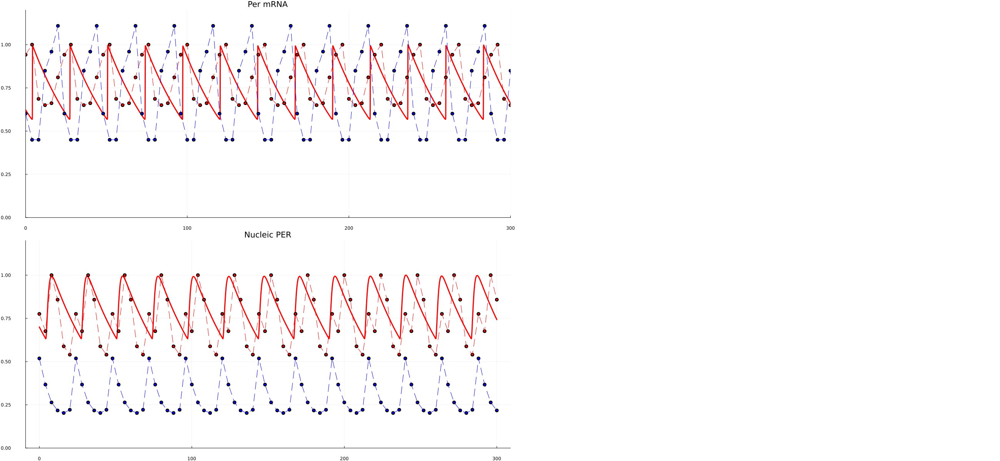

In [2]:
time_range = 0:0.01:300
bound = 300
timept = collect(0:4:bound)

paInit = [1.200362141262475, 0.0249152299921557, 0.08446899850677657, 1.1333931612771757, 0.07714014708396091, 4.663432764799844e-5, 1.8985775537599986e-9, 3.481533495332194e-5, 7.305634381746502]

# paInit = [3.2195727786370454, 0.08169318030486865, 0.2406833898390008, 0.2525807384681086, 0.1370244921303957, 6.994223601500285e-5, 1.8970457592295762e-10, 1.0645161577804551e-5, 285.0020253909471]

# Solve the ODE problem
prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
detDro = solve(prob, saveat=0.01, Rosenbrock23())

# Calculate pcm_scaling_factor
pcmMperScale, pcmPERScale = calculate_pcm_scaling_factor(paInit)                 

# pcmMper의 길이를 timept와 동일하게 반복하여 맞추기
pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052]
pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237]

wtMper = [0.6010842804859873, 0.44965606490502713, 0.4500873206666041, 0.8491425945450632, 0.9595440695087687, 1.108686629553371]
wtPER = [0.5184852832893596, 0.36710148731046305, 0.26384484454227036, 0.2173993457282554, 0.2027945985939066, 0.22124481729244966]

pcmMper_extended = repeat(pcmMper, ceil(Int, length(timept) / length(pcmMper)))[1:length(timept)]
pcmPER_extended = repeat(pcmPER, ceil(Int, length(timept) / length(pcmPER)))[1:length(timept)]

wtMper_extended = repeat(wtMper, ceil(Int, length(timept) / length(wtMper)))[1:length(timept)]
wtPER_extended = repeat(wtPER, ceil(Int, length(timept) / length(wtPER)))[1:length(timept)]

# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

xlims!(p1, 0, 300)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)


xlims!(p1, 0, 300)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합
plot(p1, p2, layout = grid(2, 1, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (2600, 1200))
 

## 끝 부분 확대한 그래프

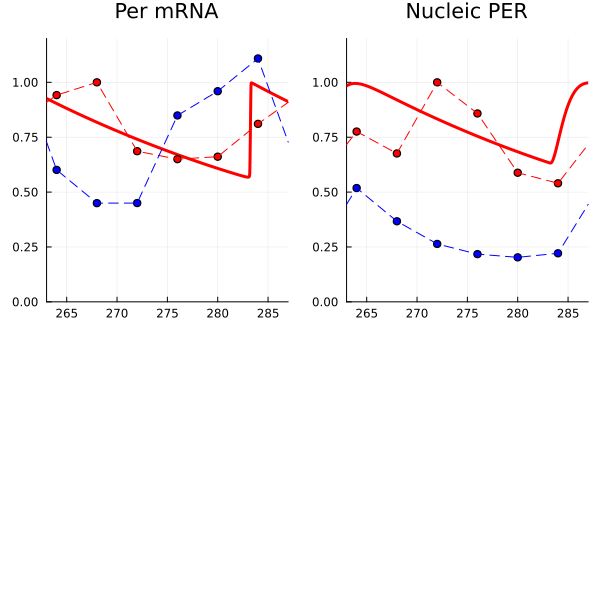

In [3]:

# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

xlims!(p1, 263, 263+24)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)


xlims!(p2, 263, 263+24)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합
plot(p1, p2, layout = grid(1, 2, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (600, 600))
 

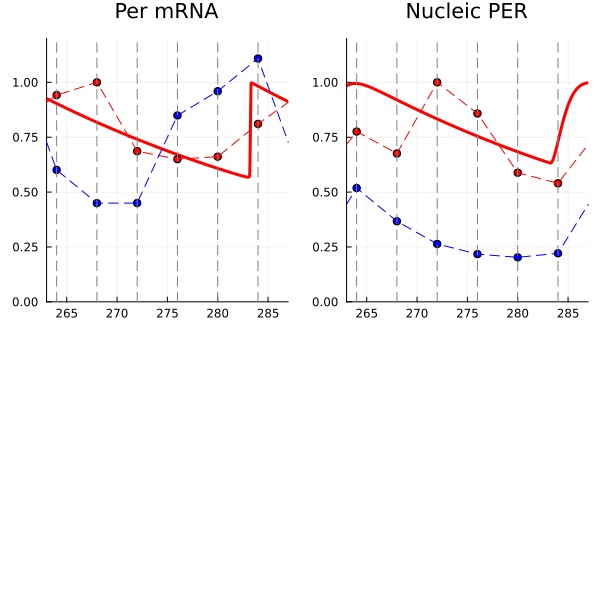

In [4]:
# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

# 수직선 추가
for x in [264, 268, 272, 276, 280, 284, 288, 292, 296, 300]
    vline!(p1, [x], linestyle=:dash, color=:gray, linewidth=1, legend=false)
end

xlims!(p1, 263, 263+24)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

# 수직선 추가
for x in [264, 268, 272, 276, 280, 284, 288, 292, 296, 300]
    vline!(p2, [x], linestyle=:dash, color=:gray, linewidth=1, legend=false)
end

xlims!(p2, 263, 263+24)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합
plot(p1, p2, layout = grid(1, 2, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (600, 600))


# SA Cost 계산하는 함수

In [5]:
function calculate_SA_cost_revised_v2(paInit, pcmMper, pcmPER)   

    # SA Cost 디폴트값 | 리듬이 안 만들어지던가, 계산 도중에 peak, trough 리스트가 비어있으면 이 값을 return 
    totalSACost = 10 
    
    a3, b1, b2, b3, AT, Ka, Ks, Kb, Kd = paInit
    
    time_range = 0:0.01:300
    bound = 300
    timept = collect(0:4:bound)

    # Solve the ODE problem
    prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
    detDro = solve(prob, saveat=0.01, Rosenbrock23())

    # ODE 끝부분
    dp1_solution_pcm = [detDro[i][1] for i in 90001:(90001+bound*100)]
    dp3_solution_pcm = [detDro[i][3] for i in 90001:(90001+bound*100)]
    
    # ---------------------------------------------------------------------------------------
    # pcm scale을 mRNA, PER에서 각각 계산하는 블록 

    peaks_dp1, troughs_dp1 = find_significant_extrema(dp1_solution_pcm)
    peaks_dp3, troughs_dp3 = find_significant_extrema(dp3_solution_pcm)

    dp1_cycle_num = length(peaks_dp1)
    dp3_cycle_num = length(peaks_dp3)

    peaks_dp1, troughs_dp1, peak_times_dp1, trough_times_dp1, amplitudes_dp1, periods_dp1 = 
        analyze_oscillations(time_range, dp1_solution_pcm, dp1_cycle_num)
    peaks_dp3, troughs_dp3, peak_times_dp3, trough_times_dp3, amplitudes_dp3, periods_dp3 = 
        analyze_oscillations(time_range, dp3_solution_pcm, dp3_cycle_num)

    if isempty(peaks_dp1) || isempty(peaks_dp3)
        println("true1")
        return totalSACost
    end

    dp1_div_factor = maximum(peaks_dp1) 
    dp3_div_factor = maximum(peaks_dp3) 
    # ---------------------------------------------------------------------------------------

    dp1_solution_pcm = dp1_solution_pcm./dp1_div_factor
    dp3_solution_pcm = dp3_solution_pcm./dp3_div_factor 

    # Find number of peaks and troughs in one pass
    peaks_dp1, troughs_dp1 = find_significant_extrema(dp1_solution_pcm)
    peaks_dp3, troughs_dp3 = find_significant_extrema(dp3_solution_pcm)
    dp1_cycle_num = length(peaks_dp1)
    dp3_cycle_num = length(peaks_dp3)
    
    # Analyze oscillations
    peaks_dp1, troughs_dp1, peak_times_dp1, trough_times_dp1, amplitudes_dp1, periods_dp1 = 
        analyze_oscillations(time_range, dp1_solution_pcm, dp1_cycle_num)
    peaks_dp3, troughs_dp3, peak_times_dp3, trough_times_dp3, amplitudes_dp3, periods_dp3 = 
        analyze_oscillations(time_range, dp3_solution_pcm, dp3_cycle_num)
 
    # Check if lengths match before division
    len_dp1 = min(length(amplitudes_dp1), length(peaks_dp1))
    len_dp3 = min(length(amplitudes_dp3), length(peaks_dp3))

    # Truncate arrays to the minimum length
    # Compute relamp using vectorized operations
    relamp_1 = amplitudes_dp1[1:len_dp1] ./ peaks_dp1[1:len_dp1]
    relamp_3 = amplitudes_dp3[1:len_dp3] ./ peaks_dp3[1:len_dp3]

    if isempty(periods_dp1) || isempty(periods_dp3)
        println("true2")
        return totalSACost
    end
    
    periods_pcmMper = periods_dp1 
    periods_pcmPER = periods_dp3

    # Calculate the period cost
    cost_periods_pcmMper = sqrt(sum((1 .- periods_pcmMper ./ 24).^2))    
    cost_periods_pcmPER = sqrt(sum((1 .- periods_pcmPER ./ 24).^2))

    if isempty(relamp_1) || isempty(relamp_3)
        println("true3")
        return totalSACost
    end
    
    cv_relamp_1 = cv(relamp_1)
    cv_relamp_3 = cv(relamp_3)
    cv_periods_pcmMper = cv(periods_pcmMper)
    cv_periods_pcmPER = cv(periods_pcmPER)

    # 일단 perturb한 그래프가 이상한 리듬을 안만드는지부터 확인 
    if cv_relamp_1 < 0.2 && cv_relamp_3 < 0.2 && cost_periods_pcmPER < 0.2 && cost_periods_pcmMper < 0.2 && cv_periods_pcmMper < 0.2 && cv_periods_pcmPER < 0.2  

        # =====================================================================================================================
        # Peak나 Trough가 찍힌 시점들을 모아둔 list 중 1개라도 empty이면 SA cost 디폴트 값 return 

        if isempty(peak_times_dp1) || isempty(trough_times_dp1) || isempty(peak_times_dp3) || isempty(trough_times_dp3) 
            println("true4")
            return totalSACost
        end

        # 범위 설정 [264, 268, 272, 276, 280, 284] : x범위 0~300 중, 가장 마지막 24시간 cycle 시간대 
        lower_bound_peak_perMrna = 264
        upper_bound_peak_perMrna = 288

        lower_bound_trough_perMrna = 264
        upper_bound_trough_perMrna = 288
        
        # 가장 마지막 24시간 시간대에서 peak값, trough값, 1개 이상 존재 가능함. 
        filtered_peaks = [x for x in peak_times_dp1 if lower_bound_peak_perMrna <= x <= upper_bound_peak_perMrna]
        filtered_troughs = [x for x in trough_times_dp1 if lower_bound_trough_perMrna <= x <= upper_bound_trough_perMrna]
        
        # 필터링 결과가 빈 리스트라면, 디폴트 SA cost값 반환하고 함수 종료
        if isempty(filtered_peaks) || isempty(filtered_troughs)
            println("true5")
            return totalSACost
        end
        
        # 빈 리스트가 아닐 경우, 최댓값 시간들 중 적은 시간으로 정의 
        pcmMrnaMaxT = minimum(filtered_peaks)
        pcmMrnaMinT = minimum(filtered_troughs)
        println("filtered_peaks_pcm_mRNA: ", filtered_peaks, "\n", "pcmMrnaMaxT: ", pcmMrnaMaxT)
        println("filtered_troughs_pcm_mRNA: ", filtered_troughs, "\n", "pcmMrnaMinT: ", pcmMrnaMinT, "\n")
              
        # 결과 출력
        # println("Minimum value in peak_times_dp1 within range [264, 288]: ", pcmMrnaMaxT)
        # println("Minimum value in trough_times_dp1 within range [264, 288]: ", pcmMrnaMinT)

        #--------------------------------------------------------------------------------------
        
        # 범위 내 값들을 필터링

        # 범위 설정 [264, 268, 272, 276, 280, 284]
        lower_bound_peak_pcmPER = 264
        upper_bound_peak_pcmPER = 288

        lower_bound_trough_pcmPER = 264
        upper_bound_trough_pcmPER = 288
        
        # 가장 마지막 24시간 시간대에서 peak값, trough값, 1개 이상 존재 가능함. 
        filtered_peaks_dp3 = [x for x in peak_times_dp3 if lower_bound_peak_pcmPER <= x <= upper_bound_peak_pcmPER]
        filtered_troughs_dp3 = [x for x in trough_times_dp3 if lower_bound_trough_pcmPER <= x <= upper_bound_trough_pcmPER]
        
        # 필터링 결과가 빈 리스트라면, 티폴트 totalSACost을 반환하고 함수 종료
        if isempty(filtered_peaks_dp3) || isempty(filtered_troughs_dp3)
            println("true6")
            return totalSACost
        end
        
        # 빈 리스트가 아닐 경우, 2개 중 적은 값으로 정의
        pcmPERMaxT = minimum(filtered_peaks_dp3)
        pcmPERMinT = minimum(filtered_troughs_dp3)
        println("filtered_peaks_pcm_PER: ", filtered_peaks_dp3, "\n", "pcmPERMaxT: ", pcmPERMaxT)
        println("filtered_troughs_pcm_PER: ", filtered_troughs_dp3, "\n", "pcmPERMinT: ", pcmPERMinT, "\n")

        # =====================================================================================================================
        # detDro1_timepoint_vals, detDro3_timepoint_vals 정의하는 부분 ----> 실선 위, pcm mRNA, pcm PER 타임포인트 해당 점들 값

        indices = [264, 268, 272, 276, 280, 284] .*= 100
        
        detDro1_end_segment_scaled = dp1_solution_pcm
        detDro3_end_segment_scaled = dp3_solution_pcm  

        # 인덱스 [264, 268, 272, 276, 280, 284]에 해당하는 값들 detDro1, detDro3 측정값들 선택 

        detDro1_timepoint_vals = []
        detDro3_timepoint_vals = []

        for idx in indices
            # println("Index ", idx, ": ", detDro1_end_segment_scaled[idx])
            push!(detDro1_timepoint_vals, detDro1_end_segment_scaled[idx])
        end

        # 인덱스에 해당하는 detDro[1]_scaled 값들을 출력
        for idx in indices
            # println("Index ", idx, ": ", detDro3_end_segment_scaled[idx])
            push!(detDro3_timepoint_vals, detDro3_end_segment_scaled[idx])
            # println("time point: ", idx, "value, detDro3_end_segment_scaled[$idx] : ", detDro3_end_segment_scaled[idx])
        end

        # println("detDro1_timepoint_vals: ", detDro1_timepoint_vals)
        # println("detDro3_timepoint_vals: ", detDro3_timepoint_vals)

        # =====================================================================================================================
        # Fitting cost 계산하는 부분

        # println("checkpoint 14: passed")
        pcmMrnaPoints = detDro1_timepoint_vals
        pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052] # 실제 점 데이터
        pcmPERpoints = detDro3_timepoint_vals
        pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237] # 실제 점 데이터 

        # pcmMrna cost 계산
        costPcmMrna_RMS = 0.0         # -------------> 1번 cost
        for i in 1:6
            costPcmMrna_RMS += (1 - pcmMrnaPoints[i] / pcmMper[i])^2
            println("pcmMrna 측정값 [$i]: ", pcmMrnaPoints[i])
            println("pcmMrna 데이터값 [$i]: ", pcmMper[i])
            println("pcmMrna 측정값[$i] / 데이터값[$i]: ", pcmMrnaPoints[i] / pcmMper[i], "\n")
        end
        println("------> costPcmMrna_RMS: ", costPcmMrna_RMS)
        
        costPcmMrna_minT_maxT = 0.0   # -------------> 2번 cost
        costPcmMrna_minT_maxT += (1 - (abs(pcmMrnaMinT - pcmMrnaMaxT)) / 8)^2  # minT - maxT cost 더하는 부분, sqrt 하기 전에
        println("------> costPcmMrna_minT_maxT: ", costPcmMrna_minT_maxT, "\n")
        # costPcmMrna_total = sqrt(costPcmMrna_RMS + costPcmMrna_minT_maxT)

        costPcmPER_RMS = 0.0          # -------------> 3번 cost
        for i in 1:6
            costPcmPER_RMS += (1 - pcmPERpoints[i] / pcmPER[i])^2
            println("pcmPER 측정값 [$i]: ", pcmPERpoints[i])
            println("pcmPER 데이터값 [$i]: ", pcmPER[i])
            println("pcmPER 측정값[$i] / 데이터값[$i]: ", pcmPERpoints[i] / pcmPER[i], "\n")
        end
        println("------> costPcmPER_RMS: ", costPcmPER_RMS)
        
        costPcmPER_minT_maxT = 0.0    # -------------> 4번 cost
        costPcmPER_minT_maxT += (1 - (abs(pcmPERMinT - pcmPERMaxT)) / 12)^2    # minT - maxT cost 더하는 부분, sqrt 하기 전에
        println("------> costPcmPER_minT_maxT: ", costPcmPER_minT_maxT, "\n")
        
        # costPcmPER_total = sqrt(costPcmPER_RMS + costPcmPER_minT_maxT)
        totalSACost = sqrt(costPcmMrna_RMS + costPcmMrna_minT_maxT)+sqrt(costPcmPER_RMS + costPcmPER_minT_maxT)
        println("======> totalSACost: ", totalSACost)
        
    end
    return totalSACost
    # println("checkpoint 7: passed")
end


calculate_SA_cost_revised_v2 (generic function with 1 method)

# Cost 함수 확인용 예시 timeseries 1번

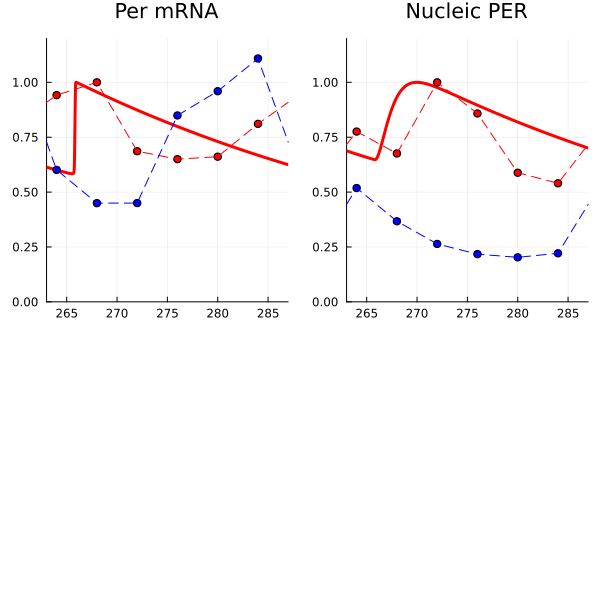

filtered_peaks_pcm_mRNA: [265.93]
pcmMrnaMaxT: 265.93
filtered_troughs_pcm_mRNA: [265.53]
pcmMrnaMinT: 265.53

filtered_peaks_pcm_PER: [270.01]
pcmPERMaxT: 270.01
filtered_troughs_pcm_PER: [265.82]
pcmPERMinT: 265.82

pcmMrna 측정값 [1]: 0.6006553202897968
pcmMrna 데이터값 [1]: 0.9417318265372026
pcmMrna 측정값[1] / 데이터값[1]: 0.6378199221517638

pcmMrna 측정값 [2]: 0.9559364171005611
pcmMrna 데이터값 [2]: 1.0
pcmMrna 측정값[2] / 데이터값[2]: 0.9559364171005611

pcmMrna 측정값 [3]: 0.8738991817026713
pcmMrna 데이터값 [3]: 0.6863256043100736
pcmMrna 측정값[3] / 데이터값[3]: 1.2733011506705412

pcmMrna 측정값 [4]: 0.7989422815280498
pcmMrna 데이터값 [4]: 0.6500461271162583
pcmMrna 측정값[4] / 데이터값[4]: 1.2290547519640278

pcmMrna 측정값 [5]: 0.7304881239698763
pcmMrna 데이터값 [5]: 0.6613263978206749
pcmMrna 측정값[5] / 데이터값[5]: 1.1045803197590718

pcmMrna 측정값 [6]: 0.6680646202504774
pcmMrna 데이터값 [6]: 0.8107829120597052
pcmMrna 측정값[6] / 데이터값[6]: 0.8239747166764189

------> costPcmMrna_RMS: 0.3021975501332911
------> costPcmMrna_minT_maxT: 0.902499

In [6]:
time_range = 0:0.01:300
bound = 300
timept = collect(0:4:bound)

paInit = [1.2591611472941155, 0.022480368, 0.12111630480870345, 0.9419074673224994, 0.094151061, 5.1853665988298946e-5, 3.0062548853823446e-9, 7.670935885911712e-5, 20.62876347705542]

# Solve the ODE problem
prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
detDro = solve(prob, saveat=0.01, Rosenbrock23())

# Calculate pcm_scaling_factor
pcmMperScale, pcmPERScale = calculate_pcm_scaling_factor(paInit)                 

# pcmMper의 길이를 timept와 동일하게 반복하여 맞추기
pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052]
pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237]

wtMper = [0.6010842804859873, 0.44965606490502713, 0.4500873206666041, 0.8491425945450632, 0.9595440695087687, 1.108686629553371]
wtPER = [0.5184852832893596, 0.36710148731046305, 0.26384484454227036, 0.2173993457282554, 0.2027945985939066, 0.22124481729244966]

pcmMper_extended = repeat(pcmMper, ceil(Int, length(timept) / length(pcmMper)))[1:length(timept)]
pcmPER_extended = repeat(pcmPER, ceil(Int, length(timept) / length(pcmPER)))[1:length(timept)]

wtMper_extended = repeat(wtMper, ceil(Int, length(timept) / length(wtMper)))[1:length(timept)]
wtPER_extended = repeat(wtPER, ceil(Int, length(timept) / length(wtPER)))[1:length(timept)]

# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

xlims!(p1, 263, 263+24)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)


xlims!(p2, 263, 263+24)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합하고 display로 표시
combined_plot = plot(p1, p2, layout = grid(1, 2, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (600, 600))
display(combined_plot)

println("SA 확인용 계산값: ", calculate_SA_cost_revised_v2(paInit, pcmMper, pcmPER), "\n") 

# Cost 함수 확인용 예시 timeseries 2번

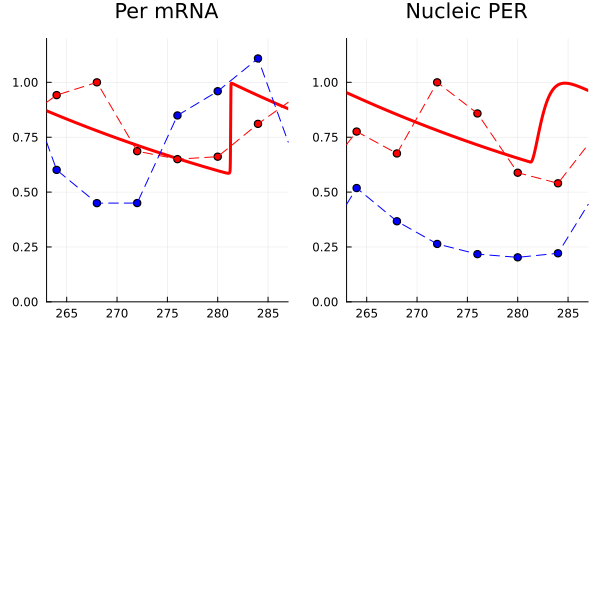

filtered_peaks_pcm_mRNA: [281.37]
pcmMrnaMaxT: 281.37
filtered_troughs_pcm_mRNA: [281.06]
pcmMrnaMinT: 281.06

filtered_peaks_pcm_PER: [284.66]
pcmPERMaxT: 284.66
filtered_troughs_pcm_PER: [281.29]
pcmPERMinT: 281.29

pcmMrna 측정값 [1]: 0.8515917376032964
pcmMrna 데이터값 [1]: 0.9417318265372026
pcmMrna 측정값[1] / 데이터값[1]: 0.9042826350412771

pcmMrna 측정값 [2]: 0.7794192921370146
pcmMrna 데이터값 [2]: 1.0
pcmMrna 측정값[2] / 데이터값[2]: 0.7794192921370146

pcmMrna 측정값 [3]: 0.7133499330582881
pcmMrna 데이터값 [3]: 0.6863256043100736
pcmMrna 측정값[3] / 데이터값[3]: 1.0393753760292546

pcmMrna 측정값 [4]: 0.6528976341324587
pcmMrna 데이터값 [4]: 0.6500461271162583
pcmMrna 측정값[4] / 데이터값[4]: 1.004386622575309

pcmMrna 측정값 [5]: 0.5977148710966819
pcmMrna 데이터값 [5]: 0.6613263978206749
pcmMrna 측정값[5] / 데이터값[5]: 0.9038122069017394

pcmMrna 측정값 [6]: 0.9404720683825301
pcmMrna 데이터값 [6]: 0.8107829120597052
pcmMrna 측정값[6] / 데이터값[6]: 1.159955463285929

------> costPcmMrna_RMS: 0.09422516710717047
------> costPcmMrna_minT_maxT: 0.9240015

In [7]:
time_range = 0:0.01:300
bound = 300
timept = collect(0:4:bound)

paInit = [1.479461305165445, 0.022139053, 0.012107067985144234, 1.4294873185899568, 0.050240079221388234, 1.1623305144614286e-6, 1.337637072495024e-9, 1.01302727579273e-5, 102.6464965056934]

# Solve the ODE problem
prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
detDro = solve(prob, saveat=0.01, Rosenbrock23())

# Calculate pcm_scaling_factor
pcmMperScale, pcmPERScale = calculate_pcm_scaling_factor(paInit)                 

# pcmMper의 길이를 timept와 동일하게 반복하여 맞추기
pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052]
pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237]

wtMper = [0.6010842804859873, 0.44965606490502713, 0.4500873206666041, 0.8491425945450632, 0.9595440695087687, 1.108686629553371]
wtPER = [0.5184852832893596, 0.36710148731046305, 0.26384484454227036, 0.2173993457282554, 0.2027945985939066, 0.22124481729244966]

pcmMper_extended = repeat(pcmMper, ceil(Int, length(timept) / length(pcmMper)))[1:length(timept)]
pcmPER_extended = repeat(pcmPER, ceil(Int, length(timept) / length(pcmPER)))[1:length(timept)]

wtMper_extended = repeat(wtMper, ceil(Int, length(timept) / length(wtMper)))[1:length(timept)]
wtPER_extended = repeat(wtPER, ceil(Int, length(timept) / length(wtPER)))[1:length(timept)]

# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

xlims!(p1, 263, 263+24)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)


xlims!(p2, 263, 263+24)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합하고 display로 표시
combined_plot = plot(p1, p2, layout = grid(1, 2, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (600, 600))
display(combined_plot)

println("SA 확인용 계산값: ", calculate_SA_cost_revised_v2(paInit, pcmMper, pcmPER), "\n") 

# Cost 함수 확인용 예시 timeseries 3번

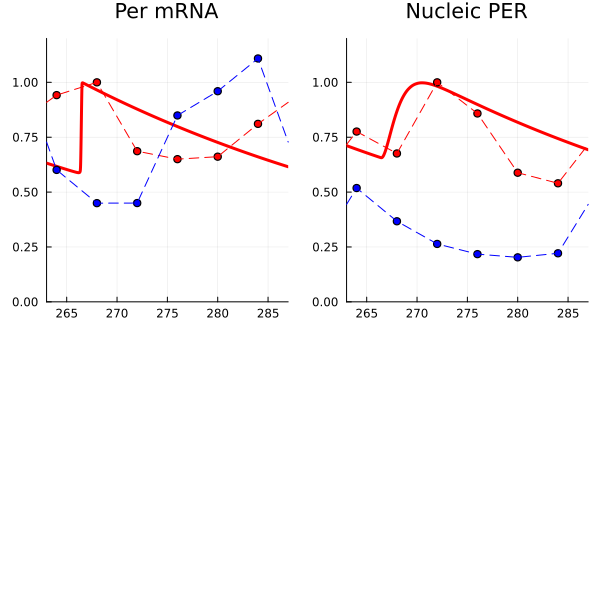

filtered_peaks_pcm_mRNA: [266.57]
pcmMrnaMaxT: 266.57
filtered_troughs_pcm_mRNA: [266.18]
pcmMrnaMinT: 266.18

filtered_peaks_pcm_PER: [270.48]
pcmPERMaxT: 270.48
filtered_troughs_pcm_PER: [266.46]
pcmPERMinT: 266.46

pcmMrna 측정값 [1]: 0.6174208705348115
pcmMrna 데이터값 [1]: 0.9417318265372026
pcmMrna 측정값[1] / 데이터값[1]: 0.655622814411084

pcmMrna 측정값 [2]: 0.9654711474222378
pcmMrna 데이터값 [2]: 1.0
pcmMrna 측정값[2] / 데이터값[2]: 0.9654711474222378

pcmMrna 측정값 [3]: 0.8781410550760003
pcmMrna 데이터값 [3]: 0.6863256043100736
pcmMrna 측정값[3] / 데이터값[3]: 1.2794817060027193

pcmMrna 측정값 [4]: 0.7987140894019291
pcmMrna 데이터값 [4]: 0.6500461271162583
pcmMrna 측정값[4] / 데이터값[4]: 1.2287037120660855

pcmMrna 측정값 [5]: 0.7264844109550346
pcmMrna 데이터값 [5]: 0.6613263978206749
pcmMrna 측정값[5] / 데이터값[5]: 1.0985262547345462

pcmMrna 측정값 [6]: 0.6607425699884126
pcmMrna 데이터값 [6]: 0.8107829120597052
pcmMrna 측정값[6] / 데이터값[6]: 0.814943877282599

------> costPcmMrna_RMS: 0.2941564909446914
------> costPcmMrna_minT_maxT: 0.90487656

In [8]:
time_range = 0:0.01:300
bound = 300
timept = collect(0:4:bound)

paInit = [1.321360882573269, 0.02370894, 0.060931492554270196, 0.9565866546859366, 0.10234070739237286, 9.875046205114785e-5, 5.621584925977796e-9, 3.907410915163952e-7, 0.8603765641461563]

# Solve the ODE problem
prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
detDro = solve(prob, saveat=0.01, Rosenbrock23())

# Calculate pcm_scaling_factor
pcmMperScale, pcmPERScale = calculate_pcm_scaling_factor(paInit)                 

# pcmMper의 길이를 timept와 동일하게 반복하여 맞추기
pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052]
pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237]

wtMper = [0.6010842804859873, 0.44965606490502713, 0.4500873206666041, 0.8491425945450632, 0.9595440695087687, 1.108686629553371]
wtPER = [0.5184852832893596, 0.36710148731046305, 0.26384484454227036, 0.2173993457282554, 0.2027945985939066, 0.22124481729244966]

pcmMper_extended = repeat(pcmMper, ceil(Int, length(timept) / length(pcmMper)))[1:length(timept)]
pcmPER_extended = repeat(pcmPER, ceil(Int, length(timept) / length(pcmPER)))[1:length(timept)]

wtMper_extended = repeat(wtMper, ceil(Int, length(timept) / length(wtMper)))[1:length(timept)]
wtPER_extended = repeat(wtPER, ceil(Int, length(timept) / length(wtPER)))[1:length(timept)]

# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

xlims!(p1, 263, 263+24)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)


xlims!(p2, 263, 263+24)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합하고 display로 표시
combined_plot = plot(p1, p2, layout = grid(1, 2, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (600, 600))
display(combined_plot)

println("SA 확인용 계산값: ", calculate_SA_cost_revised_v2(paInit, pcmMper, pcmPER), "\n") 

# SA 정의하는 부분

In [9]:
# Define the simulated annealing function

function perturb(pa)
    newpa = [pa[i] * exp(rand() - 0.5) for i in 1:length(pa)]
    return newpa
end


function simulated_annealing(objective_function, initial_state, pcmMper, pcmPER, max_iterations, initial_temp, alpha)
    # Initialize the state
    # println("checkpoint 1: passed")
    
    current_state = initial_state
    # println("checkpoint 2: passed")
    
    current_value = objective_function(current_state, pcmMper, pcmPER)
    best_state = current_state
    best_value = current_value
    
    # Initialize temperature
    temp = initial_temp

    # println("checkpoint 8: passed")
    
    for i in 1:max_iterations
        # Generate a new candidate state
        candidate_state = perturb(current_state)
        # println("checkpoint 9: passed")
        candidate_value = objective_function(candidate_state, pcmMper, pcmPER)
        # println("checkpoint 10: passed")
        
        # Calculate the change in the objective function value
        delta_value = candidate_value - current_value
        
        # Decide whether to accept the new candidate state
        if delta_value < 0 || exp(-delta_value / temp) > rand()
            current_state = candidate_state
            current_value = candidate_value
        end
        
        # Update the best state found so far: 
        # Update the best state found so far
        if current_value < best_value
            best_state = current_state
            best_value = current_value
        end
        
        # Decrease the temperature
        temp *= alpha
        
        # Print progress
        if i%200==0
            println("Iteration $i: Best_Para = $best_state, Candidate = $candidate_value, Current = $current_value, Best value = $best_value, Temperature = $temp")
        end
    end
    
    return best_state, best_value
end

 
 





simulated_annealing (generic function with 1 method)

# SA 실행하는 부분

### Cost 계산함수 (검산용 출력문 지운 버전)

In [10]:
function calculate_SA_cost_revised_v2(paInit, pcmMper, pcmPER)   

    # SA Cost 디폴트값 | 리듬이 안 만들어지던가, 계산 도중에 peak, trough 리스트가 비어있으면 이 값을 return 
    totalSACost = 10 
    
    a3, b1, b2, b3, AT, Ka, Ks, Kb, Kd = paInit
    
    time_range = 0:0.01:300
    bound = 300
    timept = collect(0:4:bound)

    # Solve the ODE problem
    prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
    detDro = solve(prob, saveat=0.01, Rosenbrock23())

    # ODE 끝부분
    dp1_solution_pcm = [detDro[i][1] for i in 90001:(90001+bound*100)]
    dp3_solution_pcm = [detDro[i][3] for i in 90001:(90001+bound*100)]
    
    # ---------------------------------------------------------------------------------------
    # pcm scale을 mRNA, PER에서 각각 계산하는 블록 

    peaks_dp1, troughs_dp1 = find_significant_extrema(dp1_solution_pcm)
    peaks_dp3, troughs_dp3 = find_significant_extrema(dp3_solution_pcm)

    dp1_cycle_num = length(peaks_dp1)
    dp3_cycle_num = length(peaks_dp3)

    peaks_dp1, troughs_dp1, peak_times_dp1, trough_times_dp1, amplitudes_dp1, periods_dp1 = 
        analyze_oscillations(time_range, dp1_solution_pcm, dp1_cycle_num)
    peaks_dp3, troughs_dp3, peak_times_dp3, trough_times_dp3, amplitudes_dp3, periods_dp3 = 
        analyze_oscillations(time_range, dp3_solution_pcm, dp3_cycle_num)

    if isempty(peaks_dp1) || isempty(peaks_dp3)
        # println("true1")
        return totalSACost
    end

    dp1_div_factor = maximum(peaks_dp1) 
    dp3_div_factor = maximum(peaks_dp3) 
    # ---------------------------------------------------------------------------------------

    dp1_solution_pcm = dp1_solution_pcm./dp1_div_factor
    dp3_solution_pcm = dp3_solution_pcm./dp3_div_factor 

    # Find number of peaks and troughs in one pass
    peaks_dp1, troughs_dp1 = find_significant_extrema(dp1_solution_pcm)
    peaks_dp3, troughs_dp3 = find_significant_extrema(dp3_solution_pcm)
    dp1_cycle_num = length(peaks_dp1)
    dp3_cycle_num = length(peaks_dp3)
    
    # Analyze oscillations
    peaks_dp1, troughs_dp1, peak_times_dp1, trough_times_dp1, amplitudes_dp1, periods_dp1 = 
        analyze_oscillations(time_range, dp1_solution_pcm, dp1_cycle_num)
    peaks_dp3, troughs_dp3, peak_times_dp3, trough_times_dp3, amplitudes_dp3, periods_dp3 = 
        analyze_oscillations(time_range, dp3_solution_pcm, dp3_cycle_num)
 
    # Check if lengths match before division
    len_dp1 = min(length(amplitudes_dp1), length(peaks_dp1))
    len_dp3 = min(length(amplitudes_dp3), length(peaks_dp3))

    # Truncate arrays to the minimum length
    # Compute relamp using vectorized operations
    relamp_1 = amplitudes_dp1[1:len_dp1] ./ peaks_dp1[1:len_dp1]
    relamp_3 = amplitudes_dp3[1:len_dp3] ./ peaks_dp3[1:len_dp3]

    if isempty(periods_dp1) || isempty(periods_dp3)
        # println("true2")
        return totalSACost
    end
    
    periods_pcmMper = periods_dp1 
    periods_pcmPER = periods_dp3

    # Calculate the period cost
    cost_periods_pcmMper = sqrt(sum((1 .- periods_pcmMper ./ 24).^2))    
    cost_periods_pcmPER = sqrt(sum((1 .- periods_pcmPER ./ 24).^2))

    if isempty(relamp_1) || isempty(relamp_3)
        # println("true3")
        return totalSACost
    end
    
    cv_relamp_1 = cv(relamp_1)
    cv_relamp_3 = cv(relamp_3)
    cv_periods_pcmMper = cv(periods_pcmMper)
    cv_periods_pcmPER = cv(periods_pcmPER)

    # 일단 perturb한 그래프가 이상한 리듬을 안만드는지부터 확인 
    if cv_relamp_1 < 0.2 && cv_relamp_3 < 0.2 && cost_periods_pcmPER < 0.2 && cost_periods_pcmMper < 0.2 && cv_periods_pcmMper < 0.2 && cv_periods_pcmPER < 0.2  

        # =====================================================================================================================
        # Peak나 Trough가 찍힌 시점들을 모아둔 list 중 1개라도 empty이면 SA cost 디폴트 값 return 

        if isempty(peak_times_dp1) || isempty(trough_times_dp1) || isempty(peak_times_dp3) || isempty(trough_times_dp3) 
           # println("true4")
            return totalSACost
        end

        # 범위 설정 [264, 268, 272, 276, 280, 284] : x범위 0~300 중, 가장 마지막 24시간 cycle 시간대 
        lower_bound_peak_perMrna = 264
        upper_bound_peak_perMrna = 288

        lower_bound_trough_perMrna = 264
        upper_bound_trough_perMrna = 288
        
        # 가장 마지막 24시간 시간대에서 peak값, trough값, 1개 이상 존재 가능함. 
        filtered_peaks = [x for x in peak_times_dp1 if lower_bound_peak_perMrna <= x <= upper_bound_peak_perMrna]
        filtered_troughs = [x for x in trough_times_dp1 if lower_bound_trough_perMrna <= x <= upper_bound_trough_perMrna]
        
        # 필터링 결과가 빈 리스트라면, 디폴트 SA cost값 반환하고 함수 종료
        if isempty(filtered_peaks) || isempty(filtered_troughs)
            # println("true5")
            return totalSACost
        end
        
        # 빈 리스트가 아닐 경우, 최댓값 시간들 중 적은 시간으로 정의 
        pcmMrnaMaxT = minimum(filtered_peaks)
        pcmMrnaMinT = minimum(filtered_troughs)
        
        # println("filtered_peaks_pcm_mRNA: ", filtered_peaks, "\n", "pcmMrnaMaxT: ", pcmMrnaMaxT)
        # println("filtered_troughs_pcm_mRNA: ", filtered_troughs, "\n", "pcmMrnaMinT: ", pcmMrnaMinT, "\n")
              
        # 결과 출력
        # println("Minimum value in peak_times_dp1 within range [264, 288]: ", pcmMrnaMaxT)
        # println("Minimum value in trough_times_dp1 within range [264, 288]: ", pcmMrnaMinT)

        #--------------------------------------------------------------------------------------
        
        # 범위 내 값들을 필터링

        # 범위 설정 [264, 268, 272, 276, 280, 284]
        lower_bound_peak_pcmPER = 264
        upper_bound_peak_pcmPER = 288

        lower_bound_trough_pcmPER = 264
        upper_bound_trough_pcmPER = 288
        
        # 가장 마지막 24시간 시간대에서 peak값, trough값, 1개 이상 존재 가능함. 
        filtered_peaks_dp3 = [x for x in peak_times_dp3 if lower_bound_peak_pcmPER <= x <= upper_bound_peak_pcmPER]
        filtered_troughs_dp3 = [x for x in trough_times_dp3 if lower_bound_trough_pcmPER <= x <= upper_bound_trough_pcmPER]
        
        # 필터링 결과가 빈 리스트라면, 티폴트 totalSACost을 반환하고 함수 종료
        if isempty(filtered_peaks_dp3) || isempty(filtered_troughs_dp3)
            # println("true6")
            return totalSACost
        end
        
        # 빈 리스트가 아닐 경우, 2개 중 적은 값으로 정의
        pcmPERMaxT = minimum(filtered_peaks_dp3)
        pcmPERMinT = minimum(filtered_troughs_dp3)
        # println("filtered_peaks_pcm_PER: ", filtered_peaks_dp3, "\n", "pcmPERMaxT: ", pcmPERMaxT)
        # println("filtered_troughs_pcm_PER: ", filtered_troughs_dp3, "\n", "pcmPERMinT: ", pcmPERMinT, "\n")

        # =====================================================================================================================
        # detDro1_timepoint_vals, detDro3_timepoint_vals 정의하는 부분 ----> 실선 위, pcm mRNA, pcm PER 타임포인트 해당 점들 값

        indices = [264, 268, 272, 276, 280, 284] .*= 100
        
        detDro1_end_segment_scaled = dp1_solution_pcm
        detDro3_end_segment_scaled = dp3_solution_pcm  

        # 인덱스 [264, 268, 272, 276, 280, 284]에 해당하는 값들 detDro1, detDro3 측정값들 선택 

        detDro1_timepoint_vals = []
        detDro3_timepoint_vals = []

        for idx in indices
            # println("Index ", idx, ": ", detDro1_end_segment_scaled[idx])
            push!(detDro1_timepoint_vals, detDro1_end_segment_scaled[idx])
        end

        # 인덱스에 해당하는 detDro[1]_scaled 값들을 출력
        for idx in indices
            # println("Index ", idx, ": ", detDro3_end_segment_scaled[idx])
            push!(detDro3_timepoint_vals, detDro3_end_segment_scaled[idx])
            # println("time point: ", idx, "value, detDro3_end_segment_scaled[$idx] : ", detDro3_end_segment_scaled[idx])
        end

        # println("detDro1_timepoint_vals: ", detDro1_timepoint_vals)
        # println("detDro3_timepoint_vals: ", detDro3_timepoint_vals)

        # =====================================================================================================================
        # Fitting cost 계산하는 부분

        # println("checkpoint 14: passed")
        pcmMrnaPoints = detDro1_timepoint_vals
        pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052] # 실제 점 데이터
        pcmPERpoints = detDro3_timepoint_vals
        pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237] # 실제 점 데이터 

        # pcmMrna cost 계산
        costPcmMrna_RMS = 0.0         # -------------> 1번 cost
        for i in 1:6
            costPcmMrna_RMS += (1 - pcmMrnaPoints[i] / pcmMper[i])^2
           # println("pcmMrna 측정값 [$i]: ", pcmMrnaPoints[i])
            #println("pcmMrna 데이터값 [$i]: ", pcmMper[i])
           # println("pcmMrna 측정값[$i] / 데이터값[$i]: ", pcmMrnaPoints[i] / pcmMper[i], "\n")
        end
        #println("------> costPcmMrna_RMS: ", costPcmMrna_RMS)
        
        costPcmMrna_minT_maxT = 0.0   # -------------> 2번 cost
        costPcmMrna_minT_maxT += (1 - (abs(pcmMrnaMinT - pcmMrnaMaxT)) / 8)^2  # minT - maxT cost 더하는 부분, sqrt 하기 전에
        #println("------> costPcmMrna_minT_maxT: ", costPcmMrna_minT_maxT, "\n")
        # costPcmMrna_total = sqrt(costPcmMrna_RMS + costPcmMrna_minT_maxT)

        costPcmPER_RMS = 0.0          # -------------> 3번 cost
        for i in 1:6
            costPcmPER_RMS += (1 - pcmPERpoints[i] / pcmPER[i])^2
            #println("pcmPER 측정값 [$i]: ", pcmPERpoints[i])
            #println("pcmPER 데이터값 [$i]: ", pcmPER[i])
            #println("pcmPER 측정값[$i] / 데이터값[$i]: ", pcmPERpoints[i] / pcmPER[i], "\n")
        end
        #println("------> costPcmPER_RMS: ", costPcmPER_RMS)
        
        costPcmPER_minT_maxT = 0.0    # -------------> 4번 cost
        costPcmPER_minT_maxT += (1 - (abs(pcmPERMinT - pcmPERMaxT)) / 12)^2    # minT - maxT cost 더하는 부분, sqrt 하기 전에
        #println("------> costPcmPER_minT_maxT: ", costPcmPER_minT_maxT, "\n")
        
        # costPcmPER_total = sqrt(costPcmPER_RMS + costPcmPER_minT_maxT)
        totalSACost = sqrt(costPcmMrna_RMS + costPcmMrna_minT_maxT)+sqrt(costPcmPER_RMS + costPcmPER_minT_maxT)
        #println("======> totalSACost: ", totalSACost)
        
    end
    return totalSACost
    # println("checkpoint 7: passed")
end


calculate_SA_cost_revised_v2 (generic function with 1 method)

In [ ]:

pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052]
pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237]
wtMper = [0.6010842804859873, 0.44965606490502713, 0.4500873206666041, 0.8491425945450632, 0.9595440695087687, 1.108686629553371]
wtPER = [0.5184852832893596, 0.36710148731046305, 0.26384484454227036, 0.2173993457282554, 0.2027945985939066, 0.22124481729244966]

# Parameters order: a3,b1,b2,b3,AT,Ka,Ks,Kb,Kd
# pcmPaInit = # [1.259161147, 0.022480368, 0.121116305, 0.941907467, 0.094151061, 5.18537E-05, 3.00625E-09, 7.67094E-05, 20.62876348]

# pcmPaInit = [1.259161147, 0.022480368, 0.121116305, 0.941907467, 0.094151061, 5.18537E-05, 3.00625E-09, 7.67094E-05, 20.62876348]

pcmPaInit = [0.20543399753598915, 0.043193609774965086, 0.005535825354487582, 0.27812144538688893, 0.01863311678314502, 2.424473605165725, 3.213777159328622e-9, 0.003828700358523781, 2.100278819435579]

best_state, best_value = simulated_annealing(calculate_SA_cost_revised_v2, pcmPaInit, pcmMper, pcmPER, 100000, 1, 0.9999)

best_state, best_value


# simulated_annealing(objective_function, initial_state, pcmMper, pcmPER, max_iterations, initial_temp, alpha)
# function calculate_SA_cost_final(paInit, pcmMper, pcmPER)   


Iteration 200: Best_Para = [0.20543399753598915, 0.043193609774965086, 0.005535825354487582, 0.27812144538688893, 0.01863311678314502, 2.424473605165725, 3.213777159328622e-9, 0.003828700358523781, 2.100278819435579], Candidate = 10, Current = 2.210633937478806, Best value = 1.036901311302694, Temperature = 0.980197693043223
Iteration 400: Best_Para = [0.20543399753598915, 0.043193609774965086, 0.005535825354487582, 0.27812144538688893, 0.01863311678314502, 2.424473605165725, 3.213777159328622e-9, 0.003828700358523781, 2.100278819435579], Candidate = 10, Current = 2.3073143575304833, Best value = 1.036901311302694, Temperature = 0.9607875174472562
Iteration 600: Best_Para = [0.20543399753598915, 0.043193609774965086, 0.005535825354487582, 0.27812144538688893, 0.01863311678314502, 2.424473605165725, 3.213777159328622e-9, 0.003828700358523781, 2.100278819435579], Candidate = 10, Current = 2.066073062327762, Best value = 1.036901311302694, Temperature = 0.9417617081065252
Iteration 800: B

## SA 결과 확인용 그래프

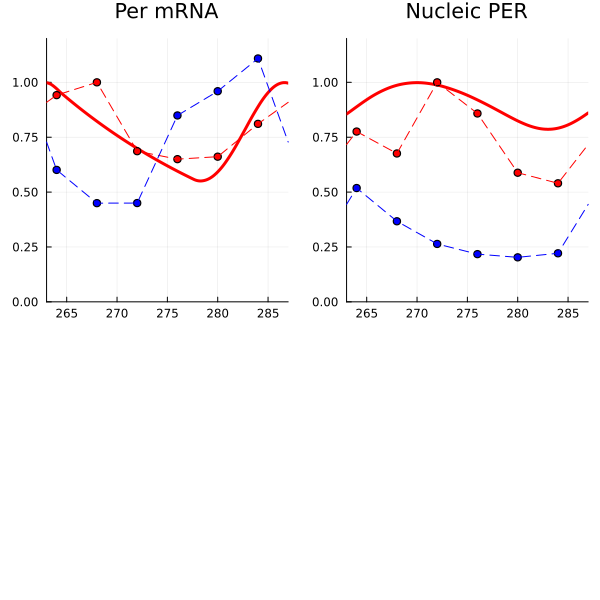

SA 확인용 계산값: 1.036901311302694



In [12]:
time_range = 0:0.01:300
bound = 300
timept = collect(0:4:bound)

paInit = [0.20543399753598915, 0.043193609774965086, 0.005535825354487582, 0.27812144538688893, 0.01863311678314502, 2.424473605165725, 3.213777159328622e-9, 0.003828700358523781, 2.100278819435579]

# Solve the ODE problem
prob = ODEProblem(modelDro!, zeros(3), (0.0, 1200.0), paInit)
detDro = solve(prob, saveat=0.01, Rosenbrock23())

# Calculate pcm_scaling_factor
pcmMperScale, pcmPERScale = calculate_pcm_scaling_factor(paInit)                 

# pcmMper의 길이를 timept와 동일하게 반복하여 맞추기
pcmMper = [0.9417318265372026, 1.000, 0.6863256043100736, 0.6500461271162583, 0.6613263978206749, 0.8107829120597052]
pcmPER = [0.775786555953261, 0.675942056075872, 1.0000, 0.8581647488931649, 0.5882726262405783, 0.5400946014398237]

wtMper = [0.6010842804859873, 0.44965606490502713, 0.4500873206666041, 0.8491425945450632, 0.9595440695087687, 1.108686629553371]
wtPER = [0.5184852832893596, 0.36710148731046305, 0.26384484454227036, 0.2173993457282554, 0.2027945985939066, 0.22124481729244966]

pcmMper_extended = repeat(pcmMper, ceil(Int, length(timept) / length(pcmMper)))[1:length(timept)]
pcmPER_extended = repeat(pcmPER, ceil(Int, length(timept) / length(pcmPER)))[1:length(timept)]

wtMper_extended = repeat(wtMper, ceil(Int, length(timept) / length(wtMper)))[1:length(timept)]
wtPER_extended = repeat(wtPER, ceil(Int, length(timept) / length(wtPER)))[1:length(timept)]

# 첫 번째 서브플롯 생성
p1 = plot([0:0.01:bound], detDro[1, 90001:(90001+bound*100)]/pcmMperScale, 
    c=:red, label="Sim", linewidth=3, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p1, timept, pcmMper_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p1, timept, wtMper_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p1, timept, wtMper_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)

xlims!(p1, 263, 263+24)
ylims!(p1, 0, 1.2)
title!(p1, "Per mRNA")

# 두 번째 서브플롯 생성
p2 = plot([0:0.01:bound], detDro[3, 90001:(90001+bound*100)]/pcmPERScale, 
    c=:red, label="Sim", linewidth=3, legend=false)

plot!(p2, timept, pcmPER_extended, seriestype=:scatter, c=:red, legend=false)
plot!(p2, timept, pcmPER_extended, seriestype=:line, linestyle=:dash, c=:red, legend=false)

plot!(p2, timept, wtPER_extended, seriestype=:scatter, c=:blue, legend=false)
plot!(p2, timept, wtPER_extended, seriestype=:line, linestyle=:dash, c=:blue, legend=false)


xlims!(p2, 263, 263+24)
ylims!(p2, 0, 1.2)
title!(p2, "Nucleic PER")

# 플롯들을 가로로 정렬하여 결합하고 display로 표시
combined_plot = plot(p1, p2, layout = grid(1, 2, widths=[0.5, 0.5], heights=[0.5, 0.5]), size = (600, 600))
display(combined_plot)

println("SA 확인용 계산값: ", calculate_SA_cost_revised_v2(paInit, pcmMper, pcmPER), "\n") 